# Style Transfer with Convolutional Neural Networks

In [1]:
import torchvision.models as models
from importlib import reload
import torch
import numpy as np
from torch.optim import LBFGS
import torch.nn as nn
from __future__ import print_function
import utils as U;reload(U)
from torch.autograd import Variable
import torch.optim as optim
import torch.autograd as autograd
from scipy.optimize import fmin_l_bfgs_b 
import matplotlib.pyplot as plt
import pdb
import copy
import scipy.misc

%matplotlib inline

In [2]:
from torchvision.transforms import ToPILImage
unloader = ToPILImage()
def unload(img):
    img = img.data
    img = img.clone().cpu()
    img = unloader(img)
    return img

def show_results(content_image, style_image, img):
    content_img = unload(content_image)
    style_img = unload(style_image)
    result_img = unload(img)
    
    f, axis = plt.subplots(1,2)
    f.set_size_inches(20, 10)
    axis[0].imshow(content_img)
    axis[1].imshow(style_img)
    plt.figure(num=None, figsize=(8, 6), dpi=120, facecolor='w', edgecolor='k')
    plt.imshow(result_img)

# Load Pretrained VGG16 model

In [3]:
vgg = models.vgg16(pretrained=True)

# Style Loss

In [4]:

class GramMatrix(nn.Module):
    def forward(self, input):
        batch_size, height, width, chan = input.size()
        flattened_channels = input.view(batch_size * height, width * chan)
        g_matrix = torch.mm(flattened_channels, flattened_channels.t())
        return g_matrix.div(flattened_channels.nelement() / 10)

class StyleLoss(nn.Module):
    def __init__(self, weight, target):
        super(StyleLoss, self).__init__()
        self.target = target.detach() * weight
        self.weight = weight
        self.gram = GramMatrix()
        self.loss_fn = nn.MSELoss()
    
    def forward(self, input):
        self.output = input.clone()
        self.G = self.gram(input)
        self.G.mul_(self.weight)
        self.loss = self.loss_fn(self.G, self.target)
        return self.output
    
    def backward(self, retain_graph=True):
        self.loss.backward(retain_graph=retain_graph)
        return self.loss
     

# Content Loss

In [5]:
class ContentLoss(nn.Module):
    def __init__(self, weight, target):
        super(ContentLoss, self).__init__()        
        self.target = target.detach()
        self.weight = weight
        self.loss_fn = nn.MSELoss()
    
    def forward(self, input):
        self.loss = self.loss_fn(input.clone(), self.target) * self.weight
        self.output = input
        return self.output
    
    def backward(self, retain_graph=True):
        self.loss.backward(retain_graph=retain_graph)
        return self.loss


In [6]:
#all conv indexes [0, 2, 5, 7, 10, 12, 14, 17, 19, 21, 24, 26, 28]
selected_content_indexes = [0, 7]
selected_style_indexes = [2, 5, 10, 12]


def build_model(cnn, content_image, style_image, content_weights, style_weights):
    content_image = content_image.cuda()
    style_image = style_image.cuda()    
    content_losses = []
    style_losses = []
    model = nn.Sequential()
    cnn = copy.deepcopy(cnn).cuda()
    gram = GramMatrix()
    for index, layer in enumerate(cnn.features):
        outer_index = index
        layer_set = False

        #Add layer to compute style loss
        if type(layer) is nn.Conv2d and index in selected_style_indexes:
            layer_set = True
            model.add_module("layer_{}_style".format(index ), layer)

            style_target = model(style_image.unsqueeze(0)).clone()
            style_loss = StyleLoss(style_weights[index], gram(style_target))
            style_losses.append(style_loss)
            model.add_module("layer_{}_style_loss".format(index), style_loss)

        #Add layer to compute content loss            
        if type(layer) is nn.Conv2d and index in selected_content_indexes:
            layer_set = True
            model.add_module("layer_{}_conv".format(index), layer)
            content_target = model(content_image.unsqueeze(0)).clone()
            content_loss = ContentLoss(content_weights[index], content_target)
            content_losses.append(content_loss)
            model.add_module("layer_{}_content_loss".format(index), content_loss)
                        
        #Avg pooling is better
        if type(layer) is nn.MaxPool2d:
            layer_set = True
            avg_pool = nn.AvgPool2d(kernel_size=layer.kernel_size, stride=layer.stride, padding = layer.padding)
            model.add_module("layer_{}".format(index), avg_pool)
        if not layer_set:
            model.add_module("layer_{}".format(index), layer)
    model.cuda()
    return model, content_losses, style_losses

In [7]:
class Runner():
    def __init__(self, model, optimizer, c_losses, s_losses, size, gen_image):
        self.optimizer = optimizer
        self.model = model
        self.c_losses = c_losses
        self.s_losses = s_losses
        self.size = size
        self.gen_image = gen_image
        self.count = 0
        self.style_loss = 0
        self.content_loss = 0

    def loss_fn(self):
        self.gen_image.data.clamp_(0,1)
        self.optimizer.zero_grad()

        self.count += 1
        prediction = self.gen_image.unsqueeze(0)
        self.model(prediction)
        
        s_loss = sum([ s.backward() for s in self.s_losses[0:-1] ])
        c_loss = sum([ c.backward() for c in self.c_losses ])
        
        #Destroy graph on last backward pass so we don't leak memory between epochs
        s_loss += self.s_losses[-1].backward(retain_graph=False)        
        self.style_loss = s_loss
        self.content_loss = c_loss
        return  self.style_loss + self.content_loss


In [8]:
def run_epochs(count, runner, gen_image):
    for i in range(count):
        runner.optimizer.step(runner.loss_fn)
        style_loss = runner.style_loss[0].data[0]
        content_loss = runner.content_loss[0].data[0]
        total = style_loss + content_loss
        if (i + 1) % 4 == 0:
            print("Epoch #{}# = Style Loss: {}, Content Loss: {}, Total Loss: {}".format(str(i), style_loss, content_loss, total))    
    gen_image.data.clamp_(0,1)

In [9]:
def build_runner(content_image, style_image, content_weights, style_weights):
    model, c_losses, s_losses = build_model(vgg, content_image, style_image, content_weights, style_weights)
    gen_image = nn.Parameter(content_image.data)
    gen_image = gen_image.cuda().clone().detach()
    gen_image.requires_grad = True
    optimizer = LBFGS([gen_image], lr=0.1)
    runner = Runner(model, optimizer, c_losses, s_losses, content_image.size(), gen_image)   
    return runner, gen_image

In [10]:
content_image = Variable(U.get_image(7, None, None, resize=900))
style_image = Variable(U.get_image(20, None, None, center_crop=900))

In [11]:
content_weights = { 0: 50, 7: 10 }

style_weights = { 2: 1400, 5: 2100, 10: 1000, 12: 1000 }

runner, gen_image = build_runner(content_image, style_image, content_weights, style_weights)
run_epochs(20, runner, gen_image)

Epoch #3# = Style Loss: 44.6027946472168, Content Loss: 9.17983341217041, Total Loss: 53.78262805938721
Epoch #7# = Style Loss: 19.65614891052246, Content Loss: 7.327335357666016, Total Loss: 26.983484268188477
Epoch #11# = Style Loss: 11.27430534362793, Content Loss: 6.911713123321533, Total Loss: 18.186018466949463
Epoch #15# = Style Loss: 6.202033996582031, Content Loss: 6.592489719390869, Total Loss: 12.7945237159729
Epoch #19# = Style Loss: 3.4876108169555664, Content Loss: 6.34074068069458, Total Loss: 9.828351497650146


In [12]:
scipy.misc.imsave('results/james-content.jpg', np.rollaxis(content_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/james-style.jpg', np.rollaxis(style_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/james-transferred.jpg', np.rollaxis(gen_image.cpu().data.numpy(), 0,3))

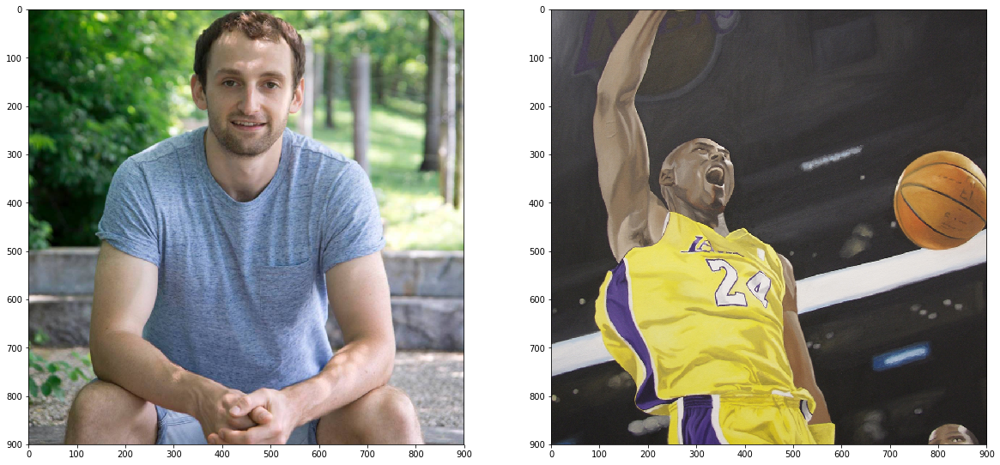

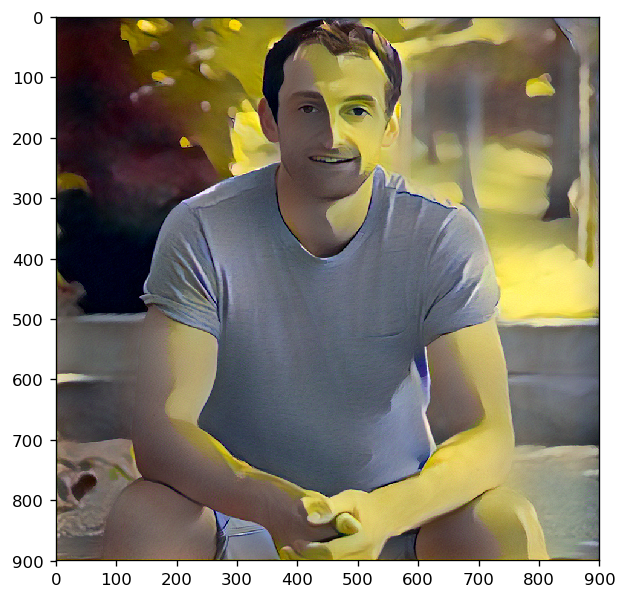

In [13]:
show_results(content_image, style_image, gen_image)

In [14]:
content_image = Variable(U.get_image(5, None, left_trim=450, resize=900))
style_image = Variable(U.get_image(16, None, None, center_crop=900))

In [15]:
content_weights = { 0: 100, 7: 100 }

style_weights = { 2: 300, 5: 500, 10: 300, 12: 500 }

runner, gen_image = build_runner(content_image, style_image, content_weights, style_weights)
run_epochs(12, runner, gen_image)

Epoch #3# = Style Loss: 38.27682113647461, Content Loss: 305.4909362792969, Total Loss: 343.7677574157715
Epoch #7# = Style Loss: 30.442947387695312, Content Loss: 271.64752197265625, Total Loss: 302.09046936035156
Epoch #11# = Style Loss: 36.7528076171875, Content Loss: 277.27349853515625, Total Loss: 314.02630615234375


In [16]:
scipy.misc.imsave('results/lizzie-content.jpg', np.rollaxis(content_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/lizzie-style.jpg', np.rollaxis(style_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/lizzie-transferred.jpg', np.rollaxis(gen_image.cpu().data.numpy(), 0,3))

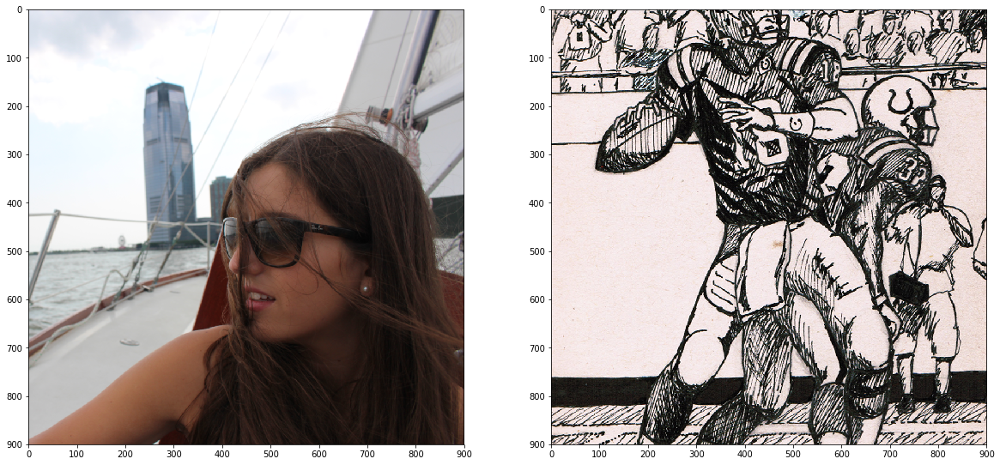

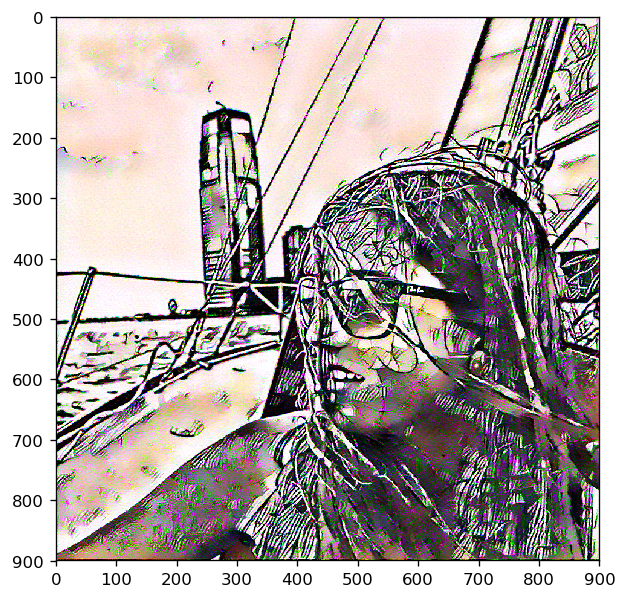

In [17]:
show_results(content_image, style_image, gen_image)

In [18]:
content_image = Variable(U.get_image(4, None,  resize=850, center_crop=850))
style_image = Variable(U.get_image(14, None, None, center_crop=850))
content_weights = { 0: 50, 7: 10 }

style_weights = { 2: 1400, 5: 2100, 10: 1000, 12: 1000 }

runner, gen_image = build_runner(content_image, style_image, content_weights, style_weights)
run_epochs(20, runner, gen_image)

Epoch #3# = Style Loss: 28.615966796875, Content Loss: 48.564300537109375, Total Loss: 77.18026733398438
Epoch #7# = Style Loss: 3.8120169639587402, Content Loss: 46.632164001464844, Total Loss: 50.444180965423584
Epoch #11# = Style Loss: 2.2022719383239746, Content Loss: 44.60676193237305, Total Loss: 46.80903387069702
Epoch #15# = Style Loss: 1.8108406066894531, Content Loss: 43.58600997924805, Total Loss: 45.3968505859375
Epoch #19# = Style Loss: 1.7100558280944824, Content Loss: 43.05902099609375, Total Loss: 44.76907682418823


In [19]:
scipy.misc.imsave('results/andrew-dani-content.jpg', np.rollaxis(content_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/andrew-dani-style.jpg', np.rollaxis(style_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/andrew-dani-transferred.jpg', np.rollaxis(gen_image.cpu().data.numpy(), 0,3))

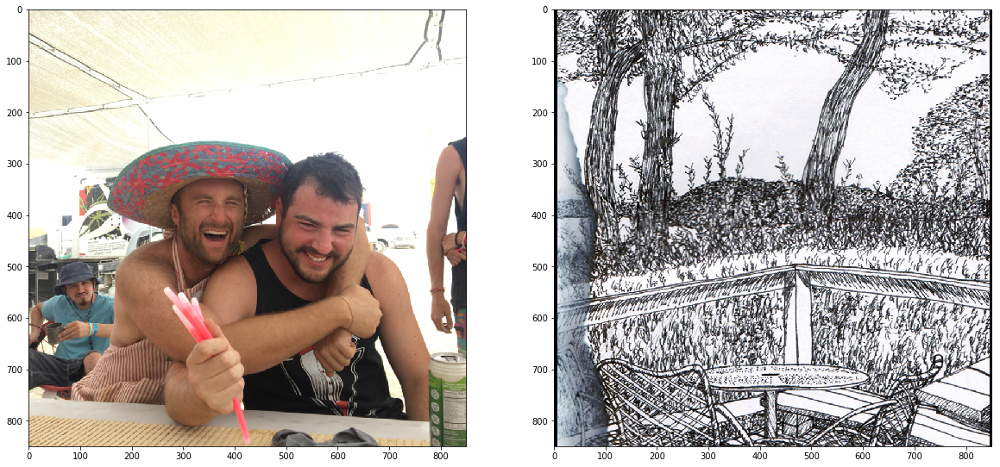

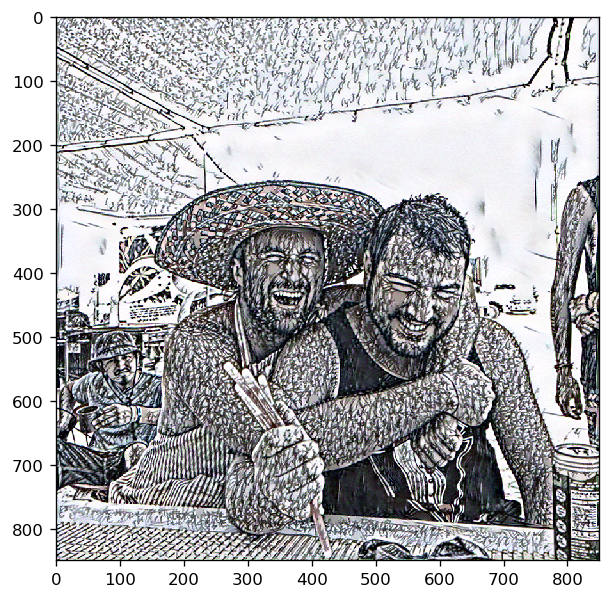

In [20]:
show_results(content_image, style_image, gen_image)

In [10]:
style_image = Variable(U.get_image(15, None, None, resize=900, center_crop=900))
content_image = Variable(U.get_image(10, None, None,resize=900, side_length=450))

In [11]:
content_weights = { 0: 50, 7: 10 }

style_weights = { 2: 1400, 5: 2100, 10: 1400, 12: 2100 }

runner, gen_image = build_runner(content_image, style_image, content_weights, style_weights)
run_epochs(20, runner, gen_image)

Epoch #3# = Style Loss: 889.6270751953125, Content Loss: 21.7518310546875, Total Loss: 911.37890625
Epoch #7# = Style Loss: 444.4570007324219, Content Loss: 25.601099014282227, Total Loss: 470.0580997467041
Epoch #11# = Style Loss: 263.1253356933594, Content Loss: 28.312030792236328, Total Loss: 291.4373664855957
Epoch #15# = Style Loss: 122.48123168945312, Content Loss: 30.366907119750977, Total Loss: 152.8481388092041
Epoch #19# = Style Loss: 113.52684020996094, Content Loss: 31.088788986206055, Total Loss: 144.615629196167


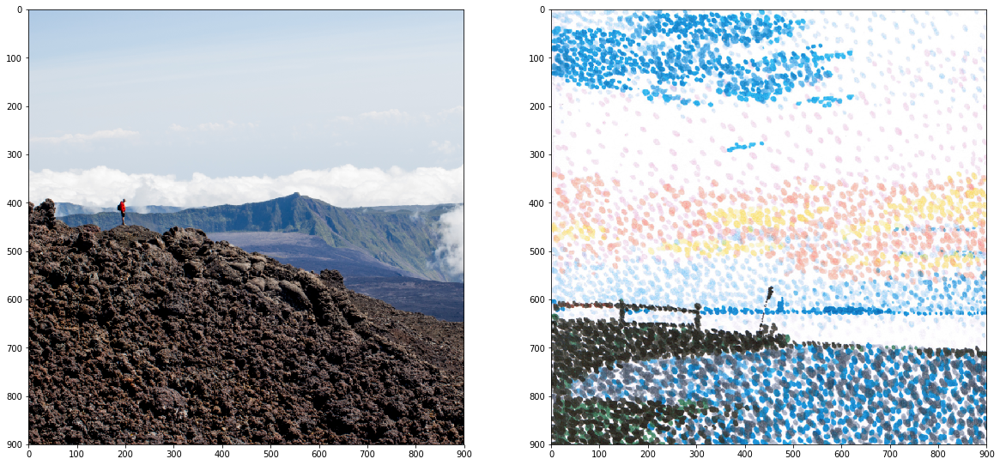

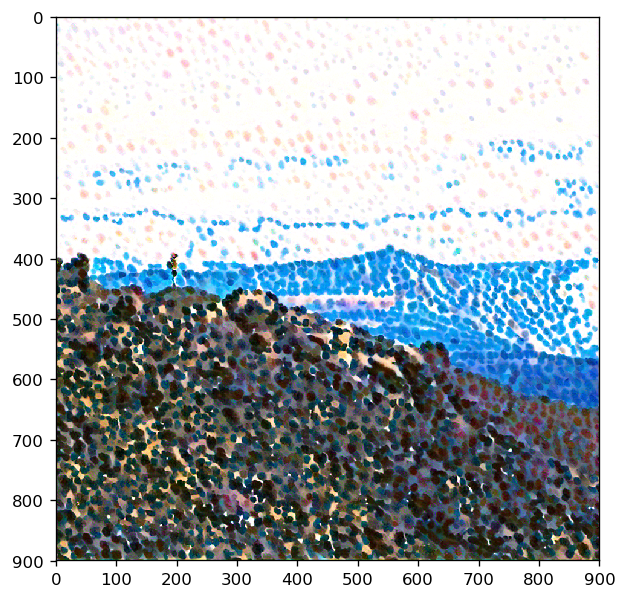

In [12]:
show_results(content_image, style_image, gen_image)

In [13]:
scipy.misc.imsave('results/reunion-content.jpg', np.rollaxis(content_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/reunion-style.jpg', np.rollaxis(style_image.cpu().data.numpy(), 0,3))
scipy.misc.imsave('results/reunion-transferred.jpg', np.rollaxis(gen_image.cpu().data.numpy(), 0,3))